## Prerequisite

Mounting to Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Clone repo and install requirements.txt in a Python>=3.7.0 environment, including PyTorch>=1.7.

In [2]:
%cd drive/MyDrive/

/content/drive/MyDrive


In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [4]:
%cd yolov5

/content/drive/MyDrive/yolov5


In [5]:
%pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 113.5 MB/s eta 0:00:00


In [6]:
%pip install -r requirements.txt  # install


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.5 MB/s eta 0:00:00


Checking for whether CUDA is installed

In [7]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.9.0+cu126 (Tesla T4)


## Data collection and preprocessing

Download custom dataset using roboflow

In [8]:
from roboflow import Roboflow
rf = Roboflow(api_key="U4jw3KsVyNLk1zr8fsjU")
project = rf.workspace("uit-dkyjd").project("helmets-detection-uu8gu")
dataset = project.version(4).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...


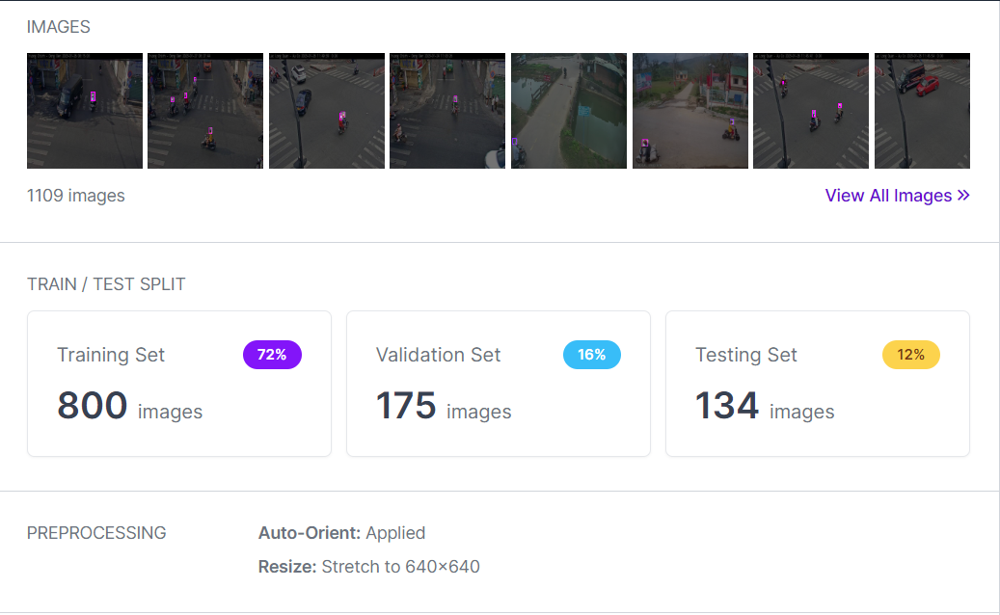

## Training Model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs.
- **data:** Our dataset locaiton
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [9]:
!python train.py --img 640 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
    106/199      4.42G    0.04955      0.022   0.002056        120        640:  54% 27/50 [00:07<00:09,  2.55it/s]/content/drive/MyDrive/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    106/199      4.42G    0.04945    0.02191   0.002012         71        640:  56% 28/50 [00:08<00:07,  2.79it/s]/content/drive/MyDrive/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    106/199      4.42G    0.04959    0.02173   0.001957         71        640:  58% 29/50 [00:08<00:06,  3.08it/s]/content/drive/MyDrive/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` inst

Run Inference With Trained Weights

In [22]:
# Thay 'exp' bằng folder model mới nhất của bạn (ví dụ exp8)
# Dán đường dẫn bạn vừa copy vào sau chữ --source

!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.5 --source /content/xe cộ.mp4

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--data DATA] [--imgsz IMGSZ [IMGSZ ...]]
                 [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img]
                 [--save-txt] [--save-format SAVE_FORMAT] [--save-csv]
                 [--save-conf] [--save-crop] [--nosave]
                 [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half] [--dnn]
                 [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: cộ.mp4


In [17]:
!python detect.py --weights runs/train/exp8/weights/best.pt --img 640 --conf 0.1 --source /content/xe cộ.mp4

usage: detect.py [-h] [--weights WEIGHTS [WEIGHTS ...]] [--source SOURCE]
                 [--data DATA] [--imgsz IMGSZ [IMGSZ ...]]
                 [--conf-thres CONF_THRES] [--iou-thres IOU_THRES]
                 [--max-det MAX_DET] [--device DEVICE] [--view-img]
                 [--save-txt] [--save-format SAVE_FORMAT] [--save-csv]
                 [--save-conf] [--save-crop] [--nosave]
                 [--classes CLASSES [CLASSES ...]] [--agnostic-nms]
                 [--augment] [--visualize] [--update] [--project PROJECT]
                 [--name NAME] [--exist-ok] [--line-thickness LINE_THICKNESS]
                 [--hide-labels] [--hide-conf] [--half] [--dnn]
                 [--vid-stride VID_STRIDE]
detect.py: error: unrecognized arguments: cộ.mp4


## Evaluate Custom YOLOv5 Detector Performance

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

## Results

In [19]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp13/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [3]:
# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Di chuyển vào thư mục chứa code và model trên Drive
%cd /content/drive/MyDrive/yolov5

# 3. Cài đặt các thư viện cần thiết (để chạy được lệnh detect)
%pip install -qr requirements.txt

Mounted at /content/drive
/content/drive/MyDrive/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.4 MB/s eta 0:00:00


In [4]:
from IPython.display import Image, display
import os

# Thay 'exp9' bằng tên folder kết quả thực tế của bạn
# Thay 'ten_anh.jpg' bằng tên file ảnh của bạn
image_path = '/content/drive/MyDrive/yolov5/runs/detect/exp9/ten_anh.jpg'

display(Image(filename=image_path))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/yolov5/runs/detect/exp9/ten_anh.jpg'

In [5]:
import glob
import os
from IPython.display import Image, display

# 1. Đường dẫn gốc chứa kết quả
detect_path = '/content/drive/MyDrive/yolov5/runs/detect'

# 2. Tìm folder 'exp' mới nhất (exp, exp2, exp3...)
try:
    # Lấy danh sách tất cả folder bắt đầu bằng 'exp'
    list_folders = glob.glob(os.path.join(detect_path, 'exp*'))
    # Sắp xếp để lấy folder mới tạo gần đây nhất
    latest_folder = max(list_folders, key=os.path.getmtime)
    print(f"✅ Đã tìm thấy folder kết quả mới nhất: {latest_folder}")

    # 3. Tìm tất cả file ảnh (.jpg, .png) trong folder đó
    image_files = glob.glob(os.path.join(latest_folder, '*.jpg')) + \
                  glob.glob(os.path.join(latest_folder, '*.jpeg')) + \
                  glob.glob(os.path.join(latest_folder, '*.png'))

    if image_files:
        print(f"--> Tìm thấy {len(image_files)} ảnh. Đang hiển thị...")
        for img_path in image_files:
            display(Image(filename=img_path))
    else:
        print("⚠️ Không tìm thấy file ảnh nào trong folder này.")
        print("   (Nếu bạn chạy detect VIDEO, hãy vào Google Drive tải video về để xem, code này chỉ hiện ảnh thôi).")

except ValueError:
    print("❌ Không tìm thấy thư mục kết quả nào (runs/detect/exp...). Bạn đã chạy lệnh detect chưa?")
except Exception as e:
    print(f"❌ Có lỗi xảy ra: {e}")

✅ Đã tìm thấy folder kết quả mới nhất: /content/drive/MyDrive/yolov5/runs/detect/exp
⚠️ Không tìm thấy file ảnh nào trong folder này.
   (Nếu bạn chạy detect VIDEO, hãy vào Google Drive tải video về để xem, code này chỉ hiện ảnh thôi).
